<a href="https://colab.research.google.com/github/SPlearning27/DDDS-My-Projects/blob/main/SP_Project2_House_Sales_Price_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project 2: Housing Price Prediction


## Business question & Project aim:

"Can we accurately predict house prices based on various features and market data to help real estate professionals, investors, and individuals make informed decisions?"

- This is a regression problem since various variables are correlated with each other using to create a model for the sale price prediction.

**Datatypes**
- This dataset is supervised, where the variable "SalePrice" is determined as a target.
- This means that the statistical data is numerical.

**Project Aim:**
- To minimize the root mean squared percentage error (RMSPE) on the prediction model of the house sales price using regression prediction techniques.


**References:**
- The original data is available on AWS S3 at https://ddc-datascience.s3.amazonaws.com/Projects/Project.2-Housing/Data/Housing.Data.csv .
- A data dictionary file is available at AWS S3 at [Housing Data Dictionary]( https://ddc-datascience.s3.amazonaws.com/Projects/Project.2-Housing/Housing%20-%20Data%20Documentation.pdf ).

# Data Information:

In [ ]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
matplotlib.style.use('ggplot')

In [ ]:
# Read in the AWS S3 .csv data
url = " https://ddc-datascience.s3.amazonaws.com/Projects/Project.2-Housing/Data/Housing.Data.csv"
house_data = pd.read_csv(url)

In [ ]:
# Check the data table at the first five rows
house_data.head()

,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,905101070,20,RL,62.0,14299,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2007,WD,Normal,115400
1,905101330,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,Shed,500,10,2006,WD,Normal,90000
2,903454090,50,RM,50.0,9000,Pave,NaN,Reg,Bnk,AllPub,...,0,NaN,NaN,NaN,0,12,2007,WD,Normal,141000
3,533244030,60,FV,68.0,7379,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,254000
4,909252020,70,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,4,2009,WD,Normal,155000


Getting the shape (rows, columns) of the data frame

In [ ]:
rows, columns = house_data.shape
{
  "Rows": rows,
  "Columns" : columns
}

{'Rows': 2637, 'Columns': 81}

In [ ]:
# To extract the list of all columns that have nulls
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2637 entries, 0 to 2636
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   PID              2637 non-null   int64  
 1   MS SubClass      2637 non-null   int64  
 2   MS Zoning        2637 non-null   object 
 3   Lot Frontage     2188 non-null   float64
 4   Lot Area         2637 non-null   int64  
 5   Street           2637 non-null   object 
 6   Alley            180 non-null    object 
 7   Lot Shape        2637 non-null   object 
 8   Land Contour     2637 non-null   object 
 9   Utilities        2637 non-null   object 
 10  Lot Config       2637 non-null   object 
 11  Land Slope       2637 non-null   object 
 12  Neighborhood     2637 non-null   object 
 13  Condition 1      2637 non-null   object 
 14  Condition 2      2637 non-null   object 
 15  Bldg Type        2637 non-null   object 
 16  House Style      2637 non-null   object 
 17  Overall Qual  

In [ ]:
# List of the columns in this data frame
house_data.describe().columns

Index(['PID', 'MS SubClass', 'Lot Frontage', 'Lot Area', 'Overall Qual',
       'Overall Cond', 'Year Built', 'Year Remod/Add', 'Mas Vnr Area',
       'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF',
       '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area',
       'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath', 'Half Bath',
       'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces',
       'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF',
       'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch',
       'Pool Area', 'Misc Val', 'Mo Sold', 'Yr Sold', 'SalePrice'],
      dtype='object')

In [ ]:
# To look at the unique variables in the columns (i = unique values in each column)
for i in house_data: print(i,":", house_data[i].unique())

PID : [905101070 905101330 903454090 ... 533253070 527376100 528292060]
MS SubClass : [ 20  90  50  60  70  40 120  80 160  30 190  85 180  45  75 150]
MS Zoning : ['RL' 'RM' 'FV' 'C (all)' 'RH' 'I (all)' 'A (agr)']
Lot Frontage : [ 62.  72.  50.  68.  60.  70.  64.  66.  nan  40. 129.  41.  83.  80.
  92. 100.  91. 101.  90.  96.  42.  69.  61.  75.  49.  78. 110. 113.
  88.  59.  74.  89.  38. 106.  77. 120.  63. 130.  85.  65.  33.  98.
  82.  54.  26.  35.  73.  24.  51.  86.  30.  21.  43.  53. 119.  76.
  44.  84. 125.  55.  79.  57. 114.  34.  36.  81.  56.  45.  37.  67.
 102.  48. 108.  93. 107. 122. 121. 118. 105.  99. 174.  39. 109.  47.
  87. 103.  71. 116. 133.  94.  95.  58. 152. 115. 112.  32.  31. 160.
 104. 128.  52.  28. 137.  97. 123. 117. 149. 138. 168. 124. 144. 134.
 155.  22.  46. 313. 131. 141. 153. 136. 135. 182. 150. 140. 200.  25.
 195.]
Lot Area : [14299 10791  9000 ...  6720  3782 12460]
Street : ['Pave' 'Grvl']
Alley : [nan 'Pave' 'Grvl']
Lot Shape : ['Reg

In [ ]:
# Get summary statistics about this data frame
# The names of the columns (variables) from the original data frame are converted to the names of indexes for the rows.
house_data.describe(include = "all" ).transpose() # if include = 'all', the statistical values of the categorical datatype(object/ string columns) will be NaN because these are mathematical calculations that cannot be performed on non-numeric (textual) data.


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
PID,2637.0,NaN,NaN,NaN,714130147.70383,188752674.750322,526301100.0,528477010.0,535453040.0,907187010.0,1007100110.0
MS SubClass,2637.0,NaN,NaN,NaN,57.349261,42.499091,20.0,20.0,50.0,70.0,190.0
MS Zoning,2637,7,RL,2043,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lot Frontage,2188.0,NaN,NaN,NaN,69.166819,23.356779,21.0,58.0,68.0,80.0,313.0
Lot Area,2637.0,NaN,NaN,NaN,10044.694729,6742.549521,1300.0,7436.0,9450.0,11526.0,164660.0
...,...,...,...,...,...,...,...,...,...,...,...
Mo Sold,2637.0,NaN,NaN,NaN,6.243838,2.722093,1.0,4.0,6.0,8.0,12.0
Yr Sold,2637.0,NaN,NaN,NaN,2007.795601,1.306403,2006.0,2007.0,2008.0,2009.0,2010.0
Sale Type,2637,10,WD,2286,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sale Condition,2637,6,Normal,2166,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
house_data.describe().transpose() # the statistics numerical data (integer/ float columns) is only calculated.

,count,mean,std,min,25%,50%,75%,max
PID,2637.0,7.141301e+08,1.887527e+08,526301100.0,5.284770e+08,535453040.0,9.071870e+08,1.007100e+09
MS SubClass,2637.0,5.734926e+01,4.249909e+01,20.0,2.000000e+01,50.0,7.000000e+01,1.900000e+02
Lot Frontage,2188.0,6.916682e+01,2.335678e+01,21.0,5.800000e+01,68.0,8.000000e+01,3.130000e+02
Lot Area,2637.0,1.004469e+04,6.742550e+03,1300.0,7.436000e+03,9450.0,1.152600e+04,1.646600e+05
Overall Qual,2637.0,6.097459e+00,1.411522e+00,1.0,5.000000e+00,6.0,7.000000e+00,1.000000e+01
Overall Cond,2637.0,5.569966e+00,1.118262e+00,1.0,5.000000e+00,5.0,6.000000e+00,9.000000e+00
Year Built,2637.0,1.971289e+03,3.030699e+01,1872.0,1.954000e+03,1973.0,2.001000e+03,2.010000e+03
Year Remod/Add,2637.0,1.984203e+03,2.091308e+01,1950.0,1.965000e+03,1993.0,2.004000e+03,2.010000e+03
Mas Vnr Area,2614.0,1.018879e+02,1.795782e+02,0.0,0.000000e+00,0.0,1.640000e+02,1.600000e+03
BsmtFin SF 1,2636.0,4.384412e+02,4.496023e+02,0.0,0.000000e+00,368.0,7.320000e+02,5.644000e+03


## Data with Nulls:

In [ ]:
# Nulls
house_data.isnull()

,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,False,False,False,False,False,False,True,False,False,False,...,False,True,False,True,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,...,False,True,True,False,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
4,False,False,False,False,False,False,True,False,False,False,...,False,True,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2632,False,False,False,False,False,False,True,False,False,False,...,False,True,False,False,False,False,False,False,False,False
2633,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
2634,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
2635,False,False,False,False,False,False,True,False,False,False,...,False,True,False,True,False,False,False,False,False,False


In [ ]:
# The sum of nulls in each column
# The names of the columns from the original data frame are converted to the names of indexes for the rows.
# sort NaN values in each column
house_data.isnull().sum().sort_values(ascending = False)

,0
Pool QC,2626
Misc Feature,2541
Alley,2457
Fence,2109
Mas Vnr Type,1607
...,...
Mo Sold,0
Yr Sold,0
Sale Type,0
Sale Condition,0


In [ ]:
# Sort values
house_data_uniques = house_data.nunique().sort_values(ascending = False)
house_data_uniques

,0
PID,2637
Lot Area,1799
Gr Liv Area,1216
Bsmt Unf SF,1080
1st Flr SF,1022
...,...
Bsmt Half Bath,3
Paved Drive,3
Street,2
Alley,2


# **Data Cleaning:**

In [ ]:
# Before doing any cleaning, let's make a copy of our data frame
house_data_clean = house_data.copy()

In [ ]:
# axis = 1 tells the function to drop a column with NaN
# in place tells the function to alter home_data_clean instead of returning a new data frame
# home_data_clean.dropna(axis = "columns", inplace=True)

house_data_clean.dropna(axis = 1, inplace=True)
house_data_clean.head()

,PID,MS SubClass,MS Zoning,Lot Area,Street,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,...,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,905101070,20,RL,14299,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,7,2007,WD,Normal,115400
1,905101330,90,RL,10791,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,500,10,2006,WD,Normal,90000
2,903454090,50,RM,9000,Pave,Reg,Bnk,AllPub,Inside,Gtl,...,0,0,126,0,0,12,2007,WD,Normal,141000
3,533244030,60,FV,7379,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,4,2010,WD,Normal,254000
4,909252020,70,RL,7200,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,4,2009,WD,Normal,155000


In [ ]:
# Check descriptive statistical data of this NaN-cleaned dataset
house_data_clean.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
PID,2637.0,7.141301e+08,1.887527e+08,526301100.0,528477010.0,535453040.0,907187010.0,1.007100e+09
MS SubClass,2637.0,5.734926e+01,4.249909e+01,20.0,20.0,50.0,70.0,1.900000e+02
Lot Area,2637.0,1.004469e+04,6.742550e+03,1300.0,7436.0,9450.0,11526.0,1.646600e+05
Overall Qual,2637.0,6.097459e+00,1.411522e+00,1.0,5.0,6.0,7.0,1.000000e+01
Overall Cond,2637.0,5.569966e+00,1.118262e+00,1.0,5.0,5.0,6.0,9.000000e+00
Year Built,2637.0,1.971289e+03,3.030699e+01,1872.0,1954.0,1973.0,2001.0,2.010000e+03
Year Remod/Add,2637.0,1.984203e+03,2.091308e+01,1950.0,1965.0,1993.0,2004.0,2.010000e+03
1st Flr SF,2637.0,1.155506e+03,3.825975e+02,334.0,878.0,1082.0,1380.0,4.692000e+03
2nd Flr SF,2637.0,3.370049e+02,4.277422e+02,0.0,0.0,0.0,708.0,2.065000e+03
Low Qual Fin SF,2637.0,4.474403e+00,4.502251e+01,0.0,0.0,0.0,0.0,1.064000e+03


In [ ]:
# Check NaN after dropping NA
house_data_clean.isnull().sum()

,0
PID,0
MS SubClass,0
MS Zoning,0
Lot Area,0
Street,0
Lot Shape,0
Land Contour,0
Utilities,0
Lot Config,0
Land Slope,0


In [ ]:
# Drop PID column
house_data_clean.drop('PID', axis = 1, inplace = True)

In [ ]:
# Recall datatype of each variables and sort them
house_data_clean.dtypes.sort_values()

,0
MS SubClass,int64
Low Qual Fin SF,int64
Gr Liv Area,int64
Full Bath,int64
Half Bath,int64
Bedroom AbvGr,int64
Kitchen AbvGr,int64
TotRms AbvGrd,int64
Fireplaces,int64
Wood Deck SF,int64


In [ ]:
# Feature selection
# Pull out object data types
house_data_categorical = house_data_clean.select_dtypes(include = 'object')
house_data_categorical.head()

,MS Zoning,Street,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,...,Foundation,Heating,Heating QC,Central Air,Electrical,Kitchen Qual,Functional,Paved Drive,Sale Type,Sale Condition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Feedr,Norm,...,CBlock,GasA,TA,Y,SBrkr,TA,Typ,N,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,...,Slab,GasA,TA,Y,SBrkr,TA,Typ,Y,WD,Normal
2,RM,Pave,Reg,Bnk,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,...,PConc,GasA,TA,Y,SBrkr,Gd,Typ,P,WD,Normal
3,FV,Pave,IR1,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,...,PConc,GasA,Ex,Y,SBrkr,Gd,Typ,Y,WD,Normal
4,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,SWISU,Feedr,Norm,...,PConc,GasA,Ex,Y,SBrkr,Gd,Typ,Y,WD,Normal


In [ ]:
house_data_categorical.shape

(2637, 28)

## Data transformation: categorical data to numerical data

In [ ]:
# One Hot Encoding is a method for converting categorical variables into a binary format by creating a new columns for each category
# where "1" means the category is present | "0" means it is not present.
# One hot encode these categories because the categorical data cannot be executed in the EDA like correlation function
house_data_encoded = pd.get_dummies(house_data_categorical)
house_data_encoded.head()

,MS Zoning_A (agr),MS Zoning_C (all),MS Zoning_FV,MS Zoning_I (all),MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Street_Grvl,Street_Pave,Lot Shape_IR1,...,Sale Type_New,Sale Type_Oth,Sale Type_VWD,Sale Type_WD,Sale Condition_Abnorml,Sale Condition_AdjLand,Sale Condition_Alloca,Sale Condition_Family,Sale Condition_Normal,Sale Condition_Partial
0,False,False,False,False,False,True,False,False,True,False,...,False,False,False,True,False,False,False,False,True,False
1,False,False,False,False,False,True,False,False,True,False,...,False,False,False,True,False,False,False,False,True,False
2,False,False,False,False,False,False,True,False,True,False,...,False,False,False,True,False,False,False,False,True,False
3,False,False,True,False,False,False,False,False,True,True,...,False,False,False,True,False,False,False,False,True,False
4,False,False,False,False,False,True,False,False,True,False,...,False,False,False,True,False,False,False,False,True,False


In [ ]:
house_data_encoded.shape

(2637, 197)

In [ ]:
# Create a data frame with only numerical values (integers, int64)
house_data_numerical = house_data_clean.select_dtypes(include = ['int64'])
house_data_numerical.shape

(2637, 26)

In [ ]:
# Combine encoded dataframe (house_data_encoded) to data frame with only numeric values (house_data_numerical)
house_data_combined = pd.concat([house_data_encoded, house_data_numerical], axis = 1)
house_data_combined.head()

,MS Zoning_A (agr),MS Zoning_C (all),MS Zoning_FV,MS Zoning_I (all),MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Street_Grvl,Street_Pave,Lot Shape_IR1,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
0,False,False,False,False,False,True,False,False,True,False,...,0,0,0,0,0,0,0,7,2007,115400
1,False,False,False,False,False,True,False,False,True,False,...,0,0,0,0,0,0,500,10,2006,90000
2,False,False,False,False,False,False,True,False,True,False,...,0,162,0,0,126,0,0,12,2007,141000
3,False,False,True,False,False,False,False,False,True,True,...,280,184,0,0,0,0,0,4,2010,254000
4,False,False,False,False,False,True,False,False,True,False,...,256,0,0,0,0,0,0,4,2009,155000


In [ ]:
house_data_combined.shape

(2637, 223)

In [ ]:
# Check datatype of the cleaned & combined dataframe
house_data_combined.dtypes.value_counts()

,count
bool,197
int64,26


#**EDA:**

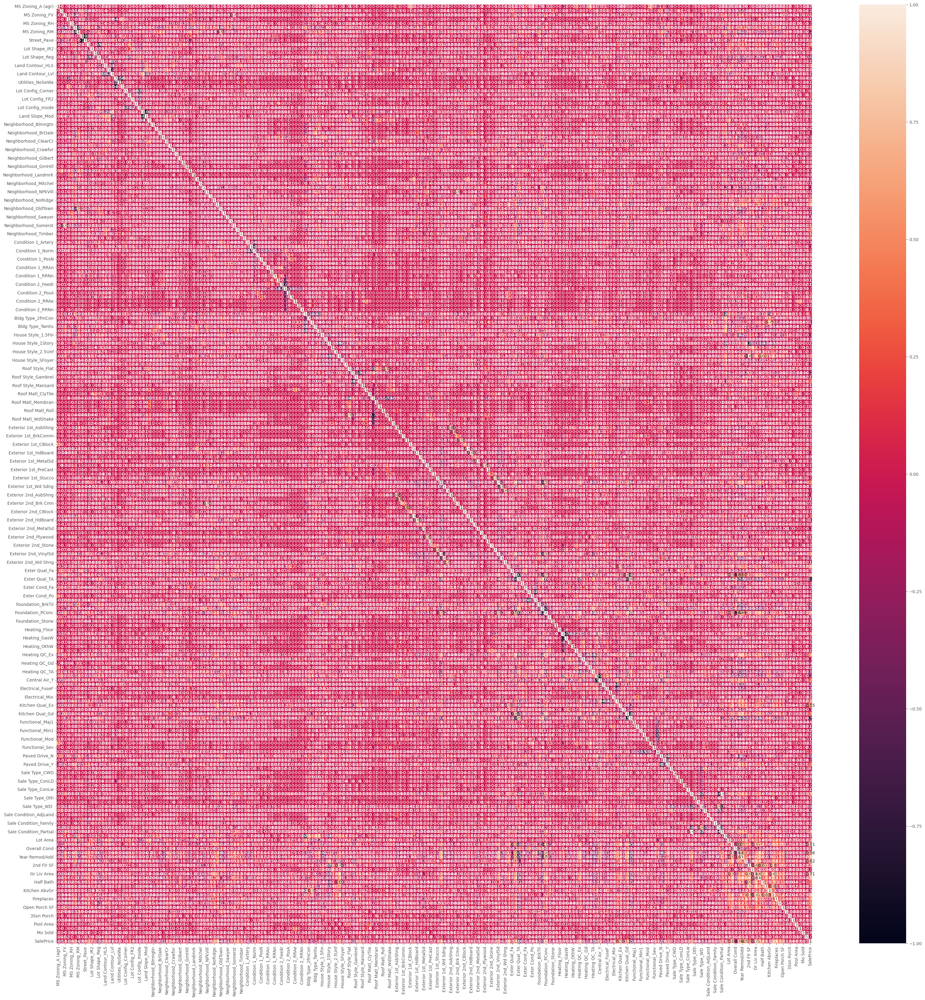

In [ ]:
# Checking correlations between predictors (variables after cleaning)
plt.figure(figsize=(40,40))
correlation_matrix = house_data_combined.corr().round(2)
sns.heatmap(data=correlation_matrix, annot=True)
plt.show()


- This correlation plot shows that the predictors are variously correlated to each other. Some variables show highly correlated while others show lightly correlated.
- Hence, let's rank (sort) from high to low correlation of each predictor or variable to the "Sale Price".     

### Sorting the correlations of all features with sale price

In [ ]:
# Sort correlations with sale price
house_data_corr = house_data_combined.corr()['SalePrice'].abs().sort_values(ascending = False)
house_data_corr

,SalePrice
SalePrice,1.000000
Overall Qual,0.805016
Gr Liv Area,0.705482
1st Flr SF,0.618247
Exter Qual_TA,0.595747
...,...
Roof Matl_ClyTile,0.004972
Lot Config_Corner,0.004778
Exterior 2nd_BrkFace,0.003152
Condition 2_RRAe,0.002491


- From the ranking of correlation above, let's focus on the variables (predictors) that yield the correlation coefficient (r) more than 0.5 and less than/equals to 1.0, (0.5 < r <= 1.0) to represent highly correlated variables with the target (sale price)
- So, there are ten variables (predictors) passing this criterion, as shown below  

### List of highly correlated-features with sale price

In [ ]:
# Create a list of the features (only continuous predictors) that are highly correlated with the target ('SalePrice')
house_data_keep = house_data_corr[(house_data_corr > 0.5) & (house_data_corr <= 1.0)]
house_data_keep

,SalePrice
SalePrice,1.000000
Overall Qual,0.805016
Gr Liv Area,0.705482
1st Flr SF,0.618247
Exter Qual_TA,0.595747
Year Built,0.562777
Kitchen Qual_Ex,0.546468
Full Bath,0.542386
Year Remod/Add,0.539932
Kitchen Qual_TA,0.533564


In [ ]:
house_data_keep.shape #include "SalePrice"

(11,)

#### Correlation plot of selected features

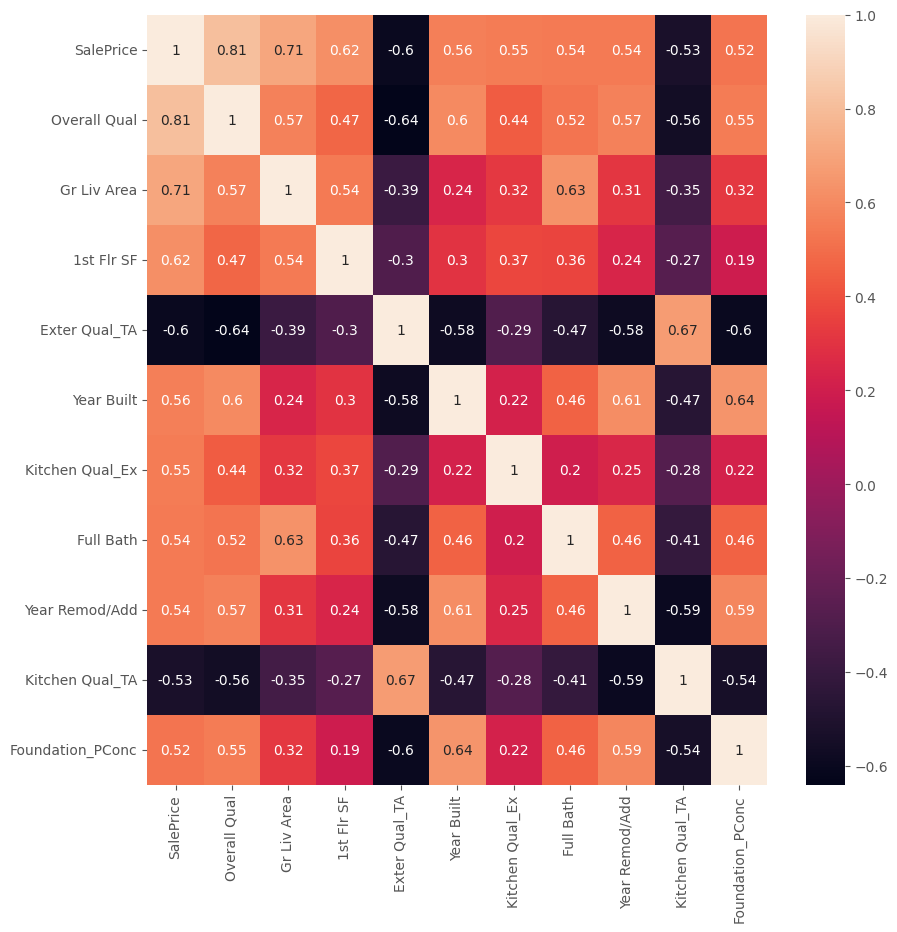

In [ ]:
# use house_data_combined and select the columns listed in house_data_keep to create a DataFrame, and then calculate the correlation matrix on that DataFrame.

plt.figure(figsize=(10,10))
correlation_matrix = house_data_combined[house_data_keep.index].corr().round(2)
sns.heatmap(data=correlation_matrix, annot=True)
plt.show()


- After replotting the correlation plot of the variables possessing r > 0.5 and r <= 1.0, the variables yield negative correlation should be removed. These include Exterior quality_TA and Kitchen quality_TA.

#### Lower Triangle Plot

In [ ]:
# Creat a list of highly correlated features to the sale price

lower_triangle = np.tril(abs(correlation_matrix)+1.1, k=-1)-1.1
lower_triangle_df  = pd.DataFrame(lower_triangle, index=correlation_matrix.index, columns=correlation_matrix.columns)
hlt_df = (
  lower_triangle_df
    .unstack()
    .to_frame()
    .rename( columns={0:"A"} )
    .query( "A > 0.50 & A <= 1.00")
    .sort_values( by = "A", ascending=False )
    .reset_index()
)
high_corrs = pd.concat([hlt_df["level_0"], hlt_df["level_1"]]).value_counts().index
high_corrs

Index(['SalePrice', 'Overall Qual', 'Exter Qual_TA', 'Year Remod/Add',
       'Foundation_PConc', 'Kitchen Qual_TA', 'Year Built', 'Gr Liv Area',
       'Full Bath', '1st Flr SF', 'Kitchen Qual_Ex'],
      dtype='object')

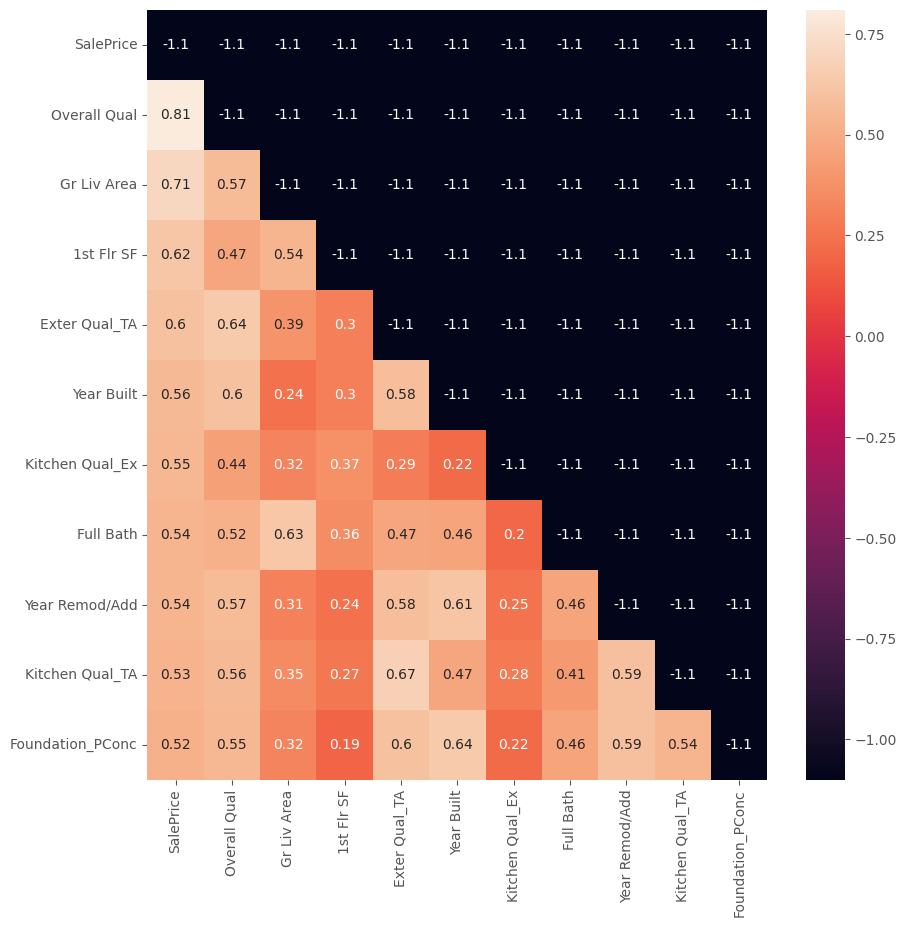

In [ ]:
# Plot lower triangle
plt.figure(figsize=(10,10))
sns.heatmap(data=lower_triangle_df, annot=True) ;

### Pairplot between selected features

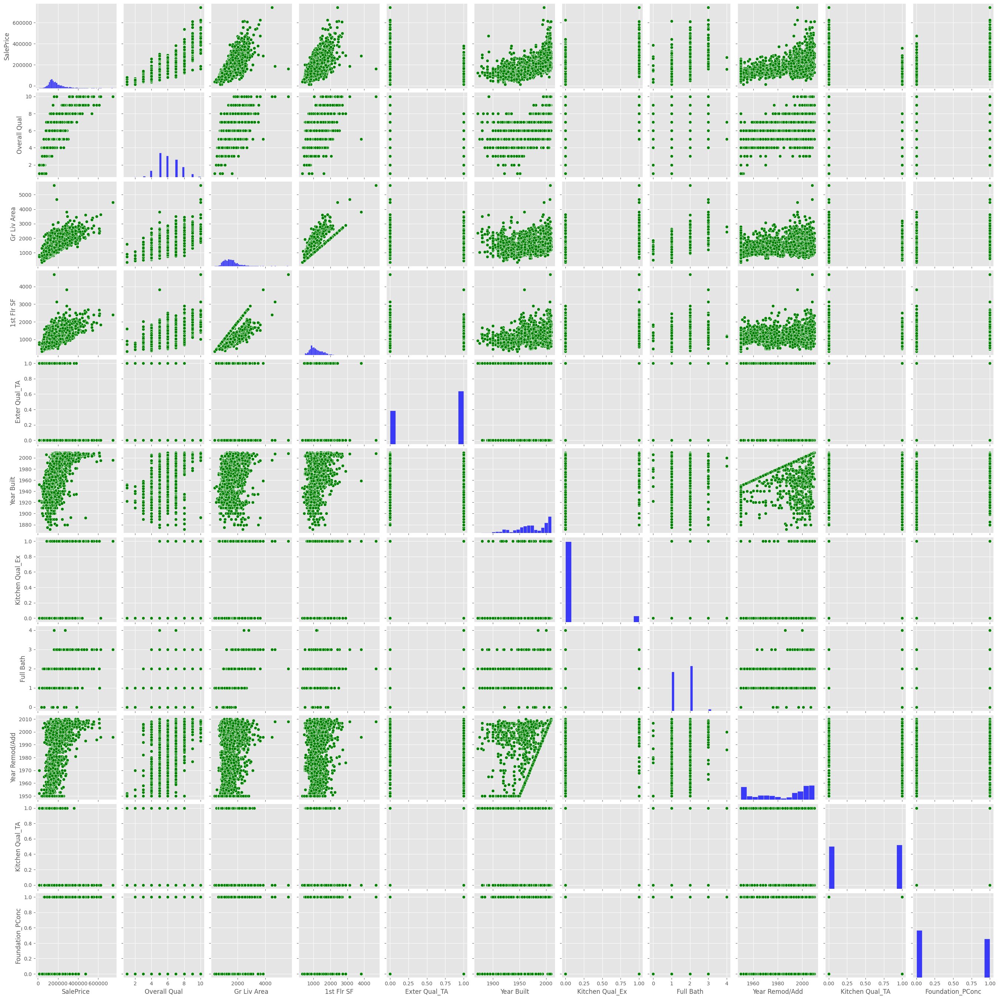

In [ ]:
# Pairplot between variables
sns.pairplot(house_data_combined[house_data_keep.index], diag_kws={'color': 'blue'}, plot_kws={'color': 'green'});

- Note #1: After replotting the correlation plot of the variables possessing r > 0.5 and r <= 1.0, the variables yield negative correlation should be removed so that Exterior quality_TA and Kitchen quality_TA are excluded from this list of the selected features.
- Note #2: The pair plot shows the strong relation of 'SalePrice' vs ['Gr Liv Area', '1st Flr SF', 'Year Built' and 'Year Remod/Add'] since they do not quite appear to be linear correlation.

# Data Processing:

# 2.1 To test these four variables (predictors) above

## 1. Statsmodels

In [ ]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

In [ ]:
# First we will break up our data into training and testing sets
x1 = house_data_combined[['Gr Liv Area', '1st Flr SF', 'Year Built', 'Year Remod/Add']]
x2 = sm.add_constant(x1) # add constant so that intercept is estimated
print(x2.head())

y1 = house_data_combined['SalePrice']
x1_train, x1_test, y1_train, y1_test = train_test_split(x2, y1, test_size = 0.2, random_state=4)

   const  Gr Liv Area  1st Flr SF  Year Built  Year Remod/Add
0    1.0         1005        1005        1964            1964
1    1.0         1296        1296        1967            1967
2    1.0         1375         780        1937            1950
3    1.0         1848         975        2000            2000
4    1.0         1135         575        1936            2007


In [ ]:
# Fit a linear model using statsmodels
house_fit = sm.OLS(y1_train, x1_train).fit()
house_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.713
Method:                 Least Squares   F-statistic:                     1308.
Date:                Wed, 18 Jun 2025   Prob (F-statistic):               0.00
Time:                        13:53:29   Log-Likelihood:                -25434.
No. Observations:                2109   AIC:                         5.088e+04
Df Residuals:                    2104   BIC:                         5.091e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -2.624e+06   9.01e+04    -29.126      0.000    -2.8e+06   -2.45e+06
Gr Liv Area       72.0000      2.252     31.970      0.000      67.583      76.417
1st Flr SF        48.9598      2.905     16.853      0.000      43.263      54.657
Year Built       695.0300     39.850     17.441      0.000     616.880     773.179
Year Remod/Add   639.5453     57.512     11.120      0.000     526.759     752.331
==============================================================================
Omnibus:                      552.088   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            32031.864
Skew:                          -0.310   Prob(JB):                         0.00
Kurtosis:                      22.082   Cond. No.                     3.35e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.35e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

What did we get from the OLS Regression Results?
- This statmodel shows a good fit with the selected data since R^2 = 0.7 meaning that 70% of the variance in y is explained by x.
- A small p-value (Prob (F-statistic) = 0.00 which is less than 0.05) indicates that this statsmodel is statistically significant and explains a significant amount of the variation in the dependent variable (SalePrice).


**Before using standard Scaler, check if the selected predictors are normal distributed.**

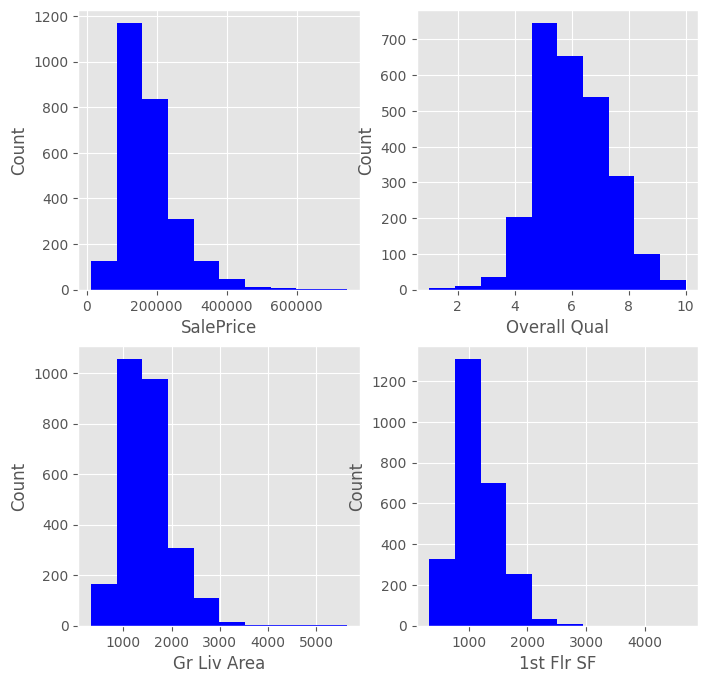

In [ ]:
# Check the distribution of sale price and other predictors in house_data_keep index
fig, axs = plt.subplots(2,2, figsize = (8,8)) # Creating 2x2 subplots because we have 4 columns that were selected from the list of the house_data_keep index
house_column_names = house_data_combined[house_data_keep.index].columns
n = 0
for i in range(2): # Loop through rows
  for j in range(2): # Loop through columns
    axs[i,j].hist(house_data_combined[house_column_names[n]], color = 'blue')
    axs[i,j].set_xlabel(house_column_names[n])
    axs[i,j].set_ylabel('Count')
    n = n + 1

## 2. Using Sklearn: Model Assessment


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

##Linear Regression--2.1

In [ ]:
# Sklearn: we will break up our data into training and testing sets
x_lir_1 = house_data_combined[['Gr Liv Area', '1st Flr SF', 'Year Built', 'Year Remod/Add']]
y_lir_1 = house_data_combined['SalePrice']


###Cross-validation of scaled model (4 features)
- Using the Standardscaler to scale the predictors (features)

In [ ]:
# %%capture --no-stdout
# Create empty list to hold results
lir1_results = []

# Calculate CV RMSPE
n = 200
lir_1_results = np.zeros(n)

for idx in range(n):
  # Create the model
  house_fit_lir1 = LinearRegression();

  # Train, test split
  x_1_train, x_1_test, y_1_train, y_1_test = train_test_split(x_lir_1, y_lir_1, test_size=0.20)

  # Standard scale only training features
  scaler1 = StandardScaler()
  scaler1.fit(x_1_train)
  x_lir_train1 = scaler1.transform(x_1_train)

  # Scale testing features
  x_lir_test1 = scaler1.transform(x_1_test)

  # Fit regression -- To fit on the scaled data
  house_fit_lir1.fit(x_1_train, y_1_train)

  # Predict -- To predict on the scaled data
  y_pred_lir_1 = house_fit_lir1.predict(x_1_test)

  # Calculate and record performance metric
  # Calculate the percentage error (avoiding division by zero)
  percentage_error_lir = np.where(y_1_test != 0, (y_1_test - y_pred_lir_1) / y_1_test, 0)
  # Calculate the mean of the squared percentage errors
  mean_squared_percentage_error_lir = np.mean(np.square(percentage_error_lir))
  # Take the square root to get RMSPE and multiply by 100
  lir_1_results[idx] = np.sqrt(mean_squared_percentage_error_lir) * 100

  lir1_results.append(lir_1_results.mean())

# After the loop, calculate the mean RMSPE
print(f"CV RMSPE from linear regression (2.1): {lir_1_results.mean().round(2)}")

CV RMSPE from linear regression (2.1): 27.58


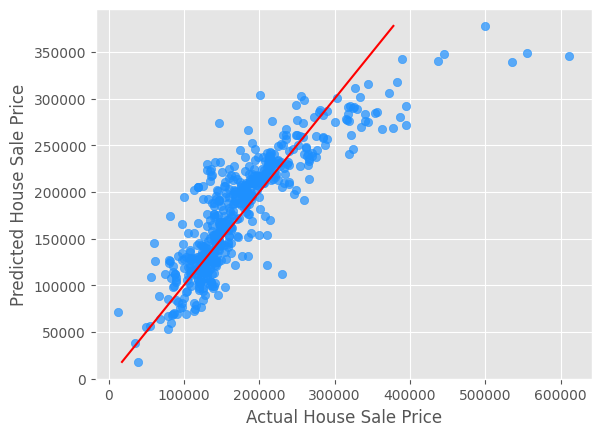

In [ ]:
# See how well our model performs on our test data
y_pred_lir_1 = house_fit_lir1.predict(x_1_test)
plt.scatter(y_1_test, y_pred_lir_1, color ='dodgerblue', alpha=0.7)
plt.plot([min(y_pred_lir_1), max(y_pred_lir_1)],[min(y_pred_lir_1), max(y_pred_lir_1)], c='red')
plt.xlabel('Actual House Sale Price')
plt.ylabel('Predicted House Sale Price') ;

In [ ]:
pd.DataFrame(x_lir_test1).describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,528.0,-0.006693,0.910754,-2.309440,-0.693948,-0.099550,0.484924,3.152272
1,528.0,-0.067855,0.916631,-2.126997,-0.743578,-0.225842,0.430816,3.949497
2,528.0,0.000128,1.032666,-3.065245,-0.574197,0.090082,1.020074,1.252572
3,528.0,-0.003079,1.011974,-1.640030,-1.016913,0.421047,0.948299,1.235892


### Residual Analysis--2.1

####Q-Q Plot

<Figure size 800x600 with 0 Axes>

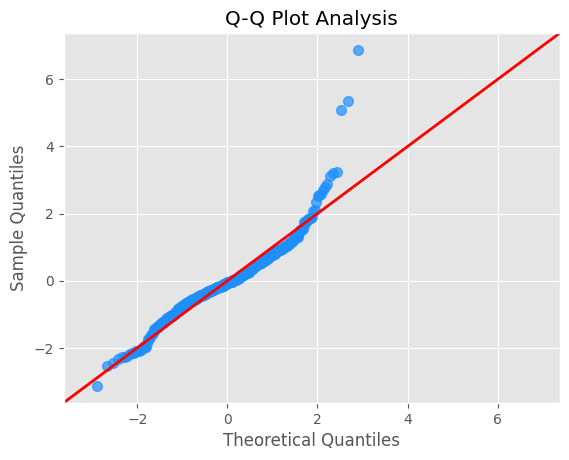

In [ ]:
# QQ Plot - Residuals are normally distributed
res_1 = y_1_test - y_pred_lir_1
plt.figure(figsize=(8, 6)); # Adjust figure size
fig = sm.qqplot(res_1, fit=True, line="45",
                markerfacecolor='dodgerblue',
                markeredgecolor='dodgerblue',
                markersize=7,
                alpha=0.7
               );
ax = fig.gca();
line_obj = ax.lines[1]
line_obj.set_color('red');
line_obj.set_linewidth(2);
plt.title("Q-Q Plot Analysis");
plt.xlabel("Theoretical Quantiles", fontsize=12);
plt.ylabel("Sample Quantiles", fontsize=12);
plt.grid(True); #Add grid
plt.show();

####Residuals vs Fitted Values Plot

In [ ]:
# Using Seaborn's regplot
import seaborn as sns

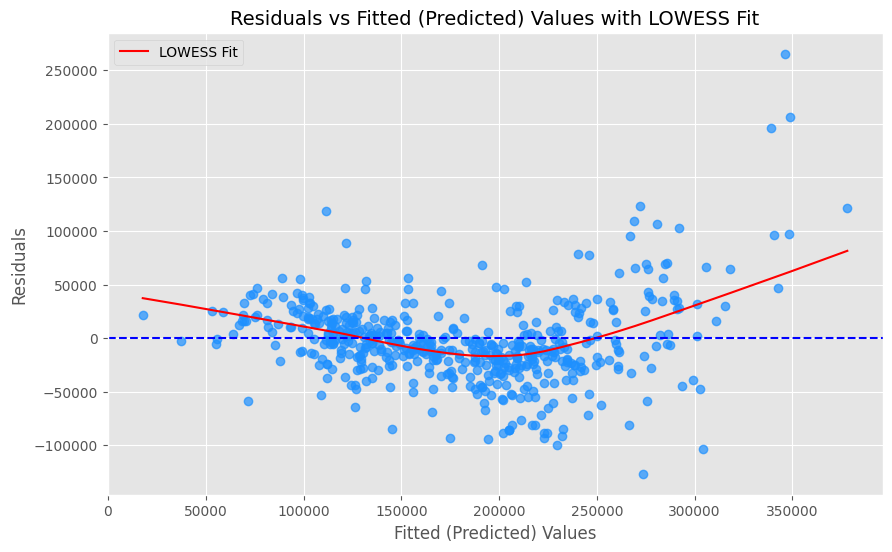

In [ ]:
# Plot a regression line, including local regression (lowess).

plt.figure(figsize=(10, 6))
sns.regplot(x = y_pred_lir_1, y = res_1, lowess = True,
            scatter_kws={'alpha': 0.7, 'color': 'dodgerblue', 'label': 'Residuals'}, # Customize scatter points
            line_kws={'color': 'red', 'lw': 1.5, 'linestyle': 'solid', 'label': 'LOWESS Fit'}) # Customize the LOWESS line

plt.axhline(y=0, color='blue', linestyle='--', linewidth=1.5) # Add the zero residual line
plt.title("Residuals vs Fitted (Predicted) Values with LOWESS Fit", fontsize=14)
plt.xlabel("Fitted (Predicted) Values", fontsize=12)
plt.ylabel("Residuals", fontsize=12)
plt.grid(True)
plt.legend(loc='upper left');
plt.show();

#### Residuals vs Time Plot

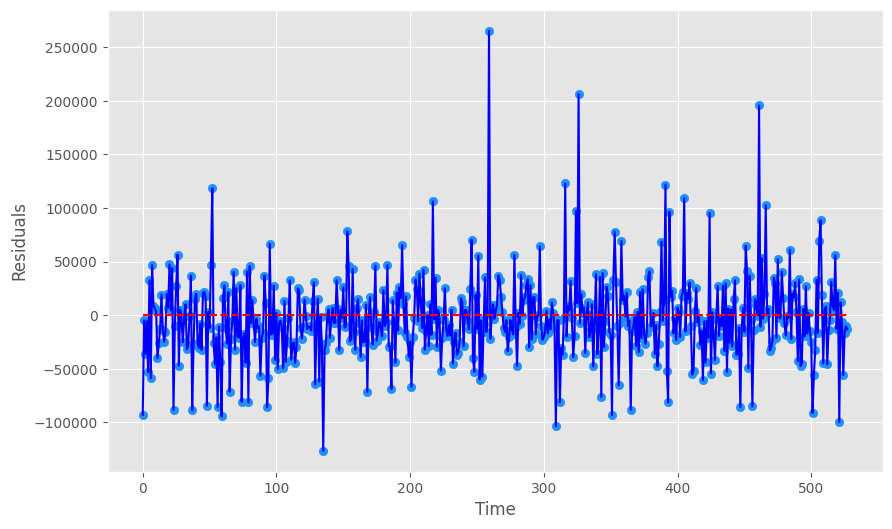

In [ ]:
# Residuals vs Time - indepedence
plt.figure(figsize = (10,6))
plt.scatter(range(len(res_1)), res_1, color='dodgerblue')
plt.plot(range(len(res_1)), res_1, 'b')
plt.xlabel("Time")
plt.ylabel("Residuals")
plt.hlines(0, min(range(len(res_1))), max(range(len(res_1))), colors = 'red', linestyles = 'dashed') ;

##Results--2.1: Linear regression

- This model provides a RMSE of about $41,376.
- Given these figures of mean and median of house price as 179,987 and 160,000, respectively, the RMSE of this linear regression model is off by 22-26%  of the average/median of the house price. This is likely unacceptable for the practical application.
- However, if this model is used for the prediction of the maximum range of house sale price of 500,000 - 745,000, the RMSE is off by 5-9% which is acceptable for using this model to predict the house sale price.

In [ ]:
# Create a data frame with the results from the models
model1_results = pd.DataFrame()
model1_results['Predictor'] = x_lir_1.columns
model1_results['Linear'] = house_fit_lir1.coef_
model1_results.sort_values(by=['Linear'],inplace=True, ascending=False)
model1_results

,Predictor,Linear
2,Year Built,737.460399
3,Year Remod/Add,620.813122
0,Gr Liv Area,70.469408
1,1st Flr SF,50.071499


##Regularization--2.1

###Lasso Regression--2.1

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

In [ ]:
# %%capture --no-stdout
x_lasso_1 = house_data_combined[['Gr Liv Area', '1st Flr SF', 'Year Built', 'Year Remod/Add']]
y_lasso_1 = house_data_combined['SalePrice']

# Specify values of alpha we want to try
alph = [50, 75, 100, 200, 300, ]

# Create empty list to hold results
lss_1_results_alpha = []

for i in alph:
  # Calculate CV RMSE
  n = 200
  lss_1_results = np.zeros(n)

  for idx in range(n):
    # Create the model
    house_fit_lasso1 = Lasso(alpha = i, tol = .01, max_iter=10_000); # Looping through alpha

    # Train, test split
    x_1_train, x_1_test, y_1_train, y_1_test = train_test_split(x_lasso_1, y_lasso_1, test_size=0.20)

    # Standard scale only training features
    scaler = StandardScaler()
    scaler.fit(x_1_train)
    x_lss_train1 = scaler.transform(x_1_train)

    # Scale testing features
    x_lss_test1 = scaler.transform(x_1_test)

    # Fit regression
    house_fit_lasso1.fit(x_1_train, y_1_train)

    # Predict
    y_pred_lss_1 = house_fit_lasso1.predict(x_1_test)

    # Calculate and record performance metric
    # Calculate the percentage error (avoiding division by zero)
    percentage_error = np.where(y_1_test != 0, (y_1_test - y_pred_lss_1) / y_1_test, 0)
    # Calculate the mean of the squared percentage errors
    mean_squared_percentage_error = np.mean(np.square(percentage_error))
    # Take the square root to get RMSPE and multiply by 100
    lss_1_results[idx] = np.sqrt(mean_squared_percentage_error) * 100

  lss_1_results_alpha.append(lss_1_results.mean())

lss_1_results_df = pd.DataFrame({'Alpha': alph, 'RMSPE': lss_1_results_alpha})

In [ ]:
# Sort to see which alpha value yields the lowest RMSPE
lss_1_results_df.sort_values( by = 'RMSPE' )

,Alpha,RMSPE
1,75,26.281783
4,300,26.685559
0,50,27.061950
2,100,27.092175
3,200,27.265193


In [ ]:
# %%capture --no-stdout
# Perform CV
n = 500
lss_1_results = np.zeros(n)
for idx in range(n):
  # Train, test split
  x_1_train, x_1_test, y_1_train, y_1_test = train_test_split(x_lasso_1, y_lasso_1, test_size=0.20)

  # Standard scale only training features
  scaler = StandardScaler()
  scaler.fit(x_1_train)
  x_lss_train1 = scaler.transform(x_1_train)

  # Scale testing features
  x_lss1_test = scaler.transform(x_1_test)

  # Create the model
  house_lss_model1 = Lasso(alpha = 300, tol = .01, max_iter=10000) # assign the alpha value with the lowest RMSPE

  # Fit regression
  house_lss_model1.fit(x_1_train, y_1_train)

  # Predict
  y_pred_lss_1 = house_lss_model1.predict(x_1_test)

  # Calculate and record performance metric
  # Calculate the percentage error (avoiding division by zero)
  percentage_error = np.where(y_1_test != 0, (y_1_test - y_pred_lss_1) / y_1_test, 0)
  # Calculate the mean of the squared percentage errors
  mean_squared_percentage_error = np.mean(np.square(percentage_error))
  # Take the square root to get RMSPE and multiply by 100
  lss_1_results[idx] = np.sqrt(mean_squared_percentage_error) * 100

print(f"CV RMSPE from lasso regression (2.1): {lss_1_results.mean().round(2)}")
print(f"Number of Predictors: {sum(house_lss_model1.coef_ >0)}")

CV RMSPE from lasso regression (2.1): 26.73
Number of Predictors: 4


In [ ]:
x_lasso_1.shape

(2637, 4)

In [ ]:
len(x_lasso_1.columns)

4

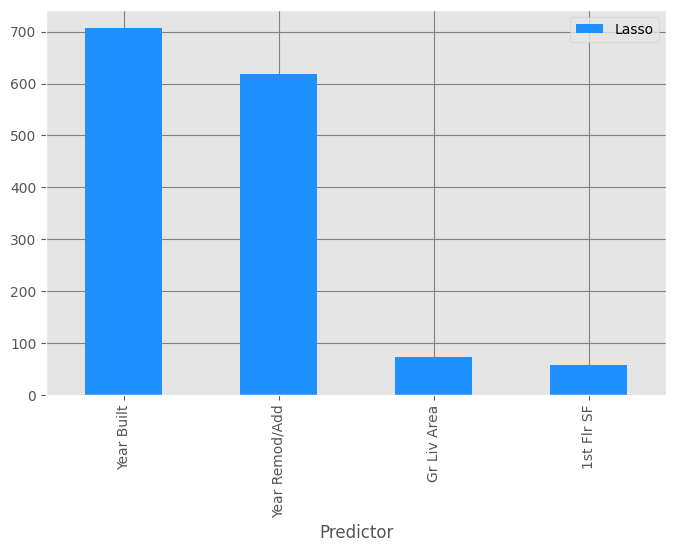

In [ ]:
# Plot coefficients of lasso model
lss_model1_results = pd.DataFrame()
lss_model1_results['Predictor'] = x_lasso_1.columns
lss_model1_results['Lasso'] = house_lss_model1.coef_
lss_model1_results.sort_values( by = ["Lasso"], ascending = False ).plot(
    x = 'Predictor',
    kind = 'bar',
    color = 'dodgerblue',
    figsize = (8,5)
    )
plt.grid(True, color='gray', which='major', axis='both')

###Ridge regression--2.1

In [ ]:
# %%capture --no-stdout
x_rr_1 = house_data_combined[['Gr Liv Area', '1st Flr SF', 'Year Built', 'Year Remod/Add']]
y_rr_1 = house_data_combined['SalePrice']

# Specify values of alpha we want to try
alph = [50, 75, 100, 200, 300, ]

# Create empty list to hold results
rr_1_results_alpha = []

for i in alph:
  # Calculate CV RMSPE
  n = 200
  rr_1_results = np.zeros(n)

  for idx in range(n):
    # Create the model
    house_fit_rr1 = Ridge(alpha = i, tol = .01, max_iter=10_000); # Looping through alpha

    # Train, test split
    x_1_train, x_1_test, y_1_train, y_1_test = train_test_split(x_rr_1, y_rr_1, test_size=0.20)

    # Standard scale only training features
    scaler_rr = StandardScaler()
    scaler_rr.fit(x_1_train)
    x_rr_train1 = scaler_rr.transform(x_1_train)

    # Scale testing features
    x_rr_test1 = scaler_rr.transform(x_1_test)

    # Fit regression
    house_fit_rr1.fit(x_1_train, y_1_train)

    # Predict
    y_pred_rr_1 = house_fit_rr1.predict(x_1_test)

    # Calculate and record performance metric
    # Calculate the percentage error (avoiding division by zero)
    percentage_error_rr1 = np.where(y_1_test != 0, (y_1_test - y_pred_rr_1) / y_1_test, 0)
    # Calculate the mean of the squared percentage errors
    mean_squared_percentage_error_rr1 = np.mean(np.square(percentage_error_rr1))
    # Take the square root to get RMSPE and multiply by 100
    rr_1_results[idx] = np.sqrt(mean_squared_percentage_error_rr1) * 100

  rr_1_results_alpha.append(rr_1_results.mean())

rr_1_results_df = pd.DataFrame({'Alpha': alph, 'RMSPE': rr_1_results_alpha})

In [ ]:
# Sort to see which alpha value yields the lowest RMSPE
rr_1_results_df.sort_values( by = 'RMSPE' )

,Alpha,RMSPE
4,300,26.617434
1,75,26.795378
2,100,26.963292
3,200,27.088283
0,50,27.200114


In [ ]:
# %%capture --no-stdout
# Perform CV
n = 500
rr_1_results = np.zeros(n)
for idx in range(n):
  # Train, test split
  x_1_train, x_1_test, y_1_train, y_1_test = train_test_split(x_rr_1, y_rr_1, test_size=0.20)

  # Standard scale only training features
  scaler_rr = StandardScaler()
  scaler_rr.fit(x_1_train)
  x_rr_train1 = scaler_rr.transform(x_1_train)

  # Scale testing features
  x_rr_test = scaler_rr.transform(x_1_test)

  # Create the model
  house_rr_model1 = Ridge(alpha = 300, tol = .01, max_iter=10000) # assign the alpha value with the lowest RMSPE

  # Fit regression
  house_rr_model1.fit(x_1_train, y_1_train)

  # Predict
  y_pred_rr_1 = house_rr_model1.predict(x_1_test)

  # Calculate and record performance metric
  # Calculate the percentage error (avoiding division by zero)
  percentage_error_rr1 = np.where(y_1_test != 0, (y_1_test - y_pred_rr_1) / y_1_test, 0)
  # Calculate the mean of the squared percentage errors
  mean_squared_percentage_error_rr1 = np.mean(np.square(percentage_error_rr1))
  # Take the square root to get RMSPE and multiply by 100
  rr_1_results[idx] = np.sqrt(mean_squared_percentage_error) * 100

print(f"CV RMSPE from ridge regression (2.1): {rr_1_results.mean().round(2)}")
print(f"Number of Predictors: {sum(house_rr_model1.coef_ >0)}")

CV RMSPE from ridge regression (2.1): 29.06
Number of Predictors: 4


In [ ]:
x_rr_1.shape

(2637, 4)

## Data Visualization -- 2.1

In [ ]:
# Add lasso regression results to the data frame created at the beginning before linear regression (2.1)
model1_results['Lasso'] = house_fit_lasso1.coef_

In [ ]:
# Add ridge regression results to the data frame created at the beginning before linear regression (2.1)
model1_results['Ridge'] = house_fit_rr1.coef_

In [ ]:
model1_results

,Predictor,Linear,Lasso,Ridge
2,Year Built,737.460399,69.567946,71.471585
3,Year Remod/Add,620.813122,51.815423,50.922038
0,Gr Liv Area,70.469408,716.808464,711.540044
1,1st Flr SF,50.071499,616.504595,667.556700


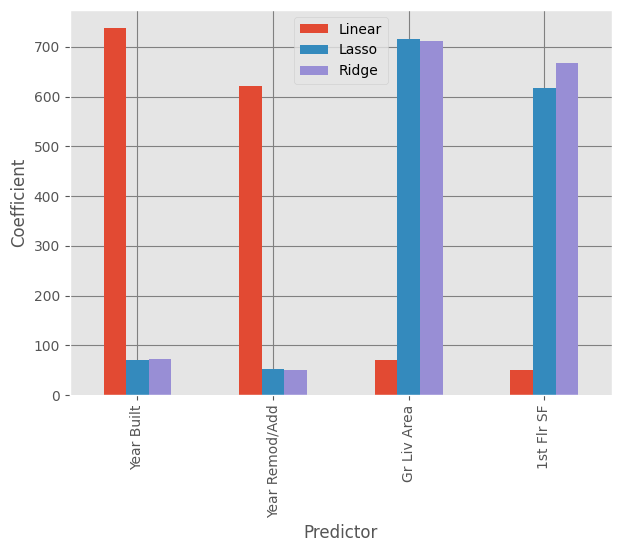

In [ ]:
# Plot the results of coefficients from all models
fig, ax = plt.subplots(1,1, figsize = (7,5))
model1_results.plot(x = 'Predictor', kind = 'bar', ax = ax)
ax.set_ylabel('Coefficient')
plt.grid(True, color='gray', which='major', axis='both')

##**Observation--2.1**
Comparison of coefficients obtained from linear, lasso and ridge regression models
1. Linear Regression (Orange Bars):
  - "Year Built" and "Year Remod/Add" have very large positive coefficients (around 730 and 610, respectively). This suggests that in the simple linear model, these features are considered to have a substantial positive impact on the predicted outcome.
  - "Gr Liv Area" and "1st Flr SF" have relatively small positive coefficients (both under 100). This indicates a much weaker impact compared to the "Year" features in the linear model.

2. Lasso Regression (Blue Bars): Lasso performs feature selection by shrinking some coefficients exactly to zero.
  - Dramatic Shift in Importance: The most striking observation is the significant change in coefficients for "Gr Liv Area" and "1st Flr SF."
      - "Gr Liv Area" now has a very large positive coefficient (around 730), becoming the most dominant feature in the Lasso model.
      - "1st Flr SF" also has a large positive coefficient (around 640), indicating strong importance.

  - Reduced Importance: "Year Built" and "Year Remod/Add" have their coefficients dramatically reduced by Lasso (both under 100), suggesting they are much less important than the linear model initially indicated.

3. Ridge Regression (Purple Bars): Ridge regression shrinks coefficients towards zero but typically does not set them exactly to zero. It's particularly useful when multicollinearity is present.

  - Similar Trend to Lasso: Ridge also assigns large positive coefficients to "Gr Liv Area" (around 710) and "1st Flr SF" (around 580), although slightly smaller than Lasso's.

  - Reduced Importance: Like Lasso, Ridge significantly reduces the coefficients for "Year Built" and "Year Remod/Add" (both under 100), similar to Lasso's reduction.

##**Which Features Are Important for This Prediction?**
When assessing feature importance, the regularized models (Lasso and Ridge) often provide a more reliable picture, especially if there's multicollinearity among features.

Based on the Lasso and Ridge models (which apply regularization to prevent overfitting and perform feature selection/shrinking):
- "Gr Liv Area" (Gross Living Area): This is unequivocally the most important feature. Both Lasso and Ridge models assign it the largest coefficients, indicating a very strong positive impact on the predicted outcome. The linear model severely underestimated its importance.

- "1st Flr SF" (First Floor Square Feet): This is the second most important feature. Similar to "Gr Liv Area," its importance is dramatically highlighted by Lasso and Ridge, which assign it large positive coefficients.

- "Year Built" and "Year Remod/Add": While the linear model initially suggested these were very important, both Lasso and Ridge substantially reduce their coefficients.
    - This indicates that their unique contribution to the prediction, after accounting for other features and regularization, is much smaller. They still have a positive impact, but it's considerably less significant than that of "Gr Liv Area" and "1st Flr SF."


# Summary I

- The RMSE of this selected features is 41.682 after regularization using lasso regression which is reduced from 41,376 as the RMSE obtained from the linear regression.  

- Lasso's Feature Selection: The sharp contrast between the Linear model and Lasso/Ridge for "Gr Liv Area" and "1st Flr SF" is critical. It suggests that in the simple linear model, the importance of these square footage features might have been masked or their effects distributed among other correlated features (like "Year Built" or "Year Remod/Add"). Lasso and Ridge, by penalizing large coefficients, have revealed the true strong predictive power of the area-related features.

- Dominant Predictors: For this prediction task, the "Gr Liv Area" and "1st Flr SF" are the most important features.

- Less Influential Predictors: "Year Built" and "Year Remod/Add" have a positive influence, but their impact is much less significant compared to the area-related features, according to the regularized models.

# 2.2 To test the model with the variables under the condition of r > 0.5 & r <= 1.0

### Linear Regression--2.2

In [ ]:
# First we will break up our data into training and testing sets
# Get the list of column names from house_data_keep that are not 'SalePrice'
features_to_keep = [col for col in house_data_keep.index if col != 'SalePrice']

# Select the features (X) from house_data_combined using the list of features_to_keep
x_2 = house_data_combined[features_to_keep].copy()

# Select the target (y) as the 'SalePrice' column from house_data_combined
y_2 = house_data_combined['SalePrice'].copy()


###Cross-validation of scaled model (10 features)

In [ ]:
# %%capture --no-stdout
x_lir_2 = house_data_combined[features_to_keep]
y_lir_2 = house_data_combined['SalePrice']

# Create empty list to hold results
lir_results = []


# Calculate CV RMSPE
n = 200
lir_2_results = np.zeros(n)

for idx in range(n):
  # Create the model
  house_fit_lir2 = LinearRegression();

  # Train, test split
  x_2_train, x_2_test, y_2_train, y_2_test = train_test_split(x_lir_2, y_lir_2, test_size=0.20)

  # Standard scale only training features
  scaler2 = StandardScaler()
  scaler2.fit(x_2_train)
  x_lir_train2 = scaler2.transform(x_2_train)

  # Scale testing features
  x_lir_test2 = scaler2.transform(x_2_test)

  # Fit regression -- To fit on the scaled data
  house_fit_lir2.fit(x_2_train, y_2_train)

  # Predict -- To predict on the scaled data
  y_pred_lir_2 = house_fit_lir2.predict(x_2_test)

  # Calculate and record performance metric
  # Calculate the percentage error (avoiding division by zero)
  percentage_error_lir = np.where(y_2_test != 0, (y_2_test - y_pred_lir_2) / y_2_test, 0)
  # Calculate the mean of the squared percentage errors
  mean_squared_percentage_error_lir = np.mean(np.square(percentage_error_lir))
  # Take the square root to get RMSPE and multiply by 100
  lir_2_results[idx] = np.sqrt(mean_squared_percentage_error_lir) * 100

  lir_results.append(lir_2_results.mean())

# After the loop, calculate the mean RMSPE
print(f"CV RMSPE from linear regression (2.2): {lir_2_results.mean().round(2)}")

CV RMSPE from linear regression (2.2): 20.7


In [ ]:
x_lir_2.columns

Index(['Overall Qual', 'Gr Liv Area', '1st Flr SF', 'Exter Qual_TA',
       'Year Built', 'Kitchen Qual_Ex', 'Full Bath', 'Year Remod/Add',
       'Kitchen Qual_TA', 'Foundation_PConc'],
      dtype='object')

In [ ]:
# Create a data frame with the results from the models
model2_results = pd.DataFrame()
model2_results['Predictor'] = x_lir_2.columns
model2_results['Linear'] = house_fit_lir2.coef_
model2_results.sort_values(by=['Linear'],inplace=True, ascending=False)
model2_results


,Predictor,Linear
5,Kitchen Qual_Ex,57138.635766
0,Overall Qual,17987.436738
9,Foundation_PConc,5319.922368
4,Year Built,369.639548
7,Year Remod/Add,179.643728
1,Gr Liv Area,52.422518
2,1st Flr SF,33.632512
8,Kitchen Qual_TA,-4174.087515
3,Exter Qual_TA,-6736.688068
6,Full Bath,-8906.197655


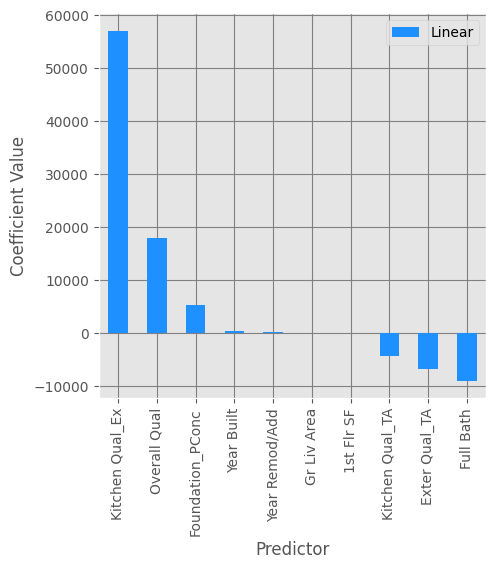

In [ ]:
# We can even plot the coefficients if we want to!
model2_results.plot(x = 'Predictor',
                       y = 'Linear',
                       kind = 'bar',
                       color = 'dodgerblue',
                       figsize = (5,5))
plt.ylabel('Coefficient Value') ;
plt.grid(True, color='gray', which='major', axis='both')


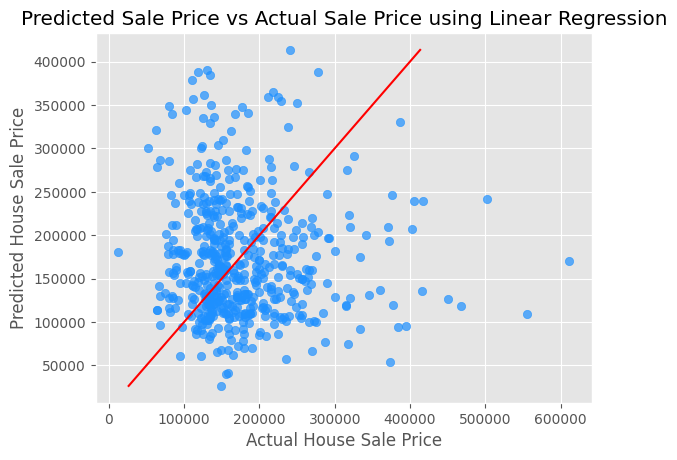

In [ ]:
# Observe how well this scaling model performs on our test data
plt.scatter(y_2_test, y_pred_lir_2, color = 'dodgerblue', alpha=0.7)
plt.plot([min(y_pred_lir_2), max(y_pred_lir_2)],[min(y_pred_lir_2), max(y_pred_lir_2)], c='red')
plt.title("Predicted Sale Price vs Actual Sale Price using Linear Regression")
plt.xlabel('Actual House Sale Price')
plt.ylabel('Predicted House Sale Price') ;

In [ ]:
pd.DataFrame(x_lir_train2).describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,2109.0,1.684549e-16,1.000237,-3.619275,-0.793004,-0.086436,0.620131,2.739835
1,2109.0,-1.263412e-16,1.000237,-2.339883,-0.754222,-0.099189,0.479957,8.260477
2,2109.0,-2.240450e-16,1.000237,-2.120842,-0.717977,-0.188063,0.582489,9.035519
3,2109.0,6.990878e-17,1.000237,-1.237664,-1.237664,0.807974,0.807974,0.807974
4,2109.0,5.895921e-17,1.000237,-3.096647,-0.601450,0.063936,0.962207,1.261630
5,2109.0,5.306329e-17,1.000237,-0.273722,-0.273722,-0.273722,-0.273722,3.653346
6,2109.0,-7.748925e-17,1.000237,-2.834881,-1.031332,0.772216,0.772216,4.379313
7,2109.0,1.376276e-15,1.000237,-1.667854,-0.899274,0.445742,0.926105,1.214322
8,2109.0,6.906651e-17,1.000237,-1.007138,-1.007138,0.992913,0.992913,0.992913
9,2109.0,3.495439e-17,1.000237,-0.927248,-0.927248,-0.927248,1.078460,1.078460


In [ ]:
 pd.DataFrame(x_lir_test2).describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,528.0,-0.087775,0.983470,-3.619275,-0.793004,-0.086436,0.620131,2.739835
1,528.0,-0.086598,0.940298,-1.776714,-0.755221,-0.211024,0.444010,3.968809
2,528.0,-0.088946,0.888869,-1.844365,-0.764057,-0.271262,0.426971,3.331900
3,528.0,0.071854,0.982747,-1.237664,-1.237664,0.807974,0.807974,0.807974
4,528.0,-0.131206,1.034167,-3.329532,-0.767797,-0.102411,0.862399,1.261630
5,528.0,0.001471,1.003432,-0.273722,-0.273722,-0.273722,-0.273722,3.653346
6,528.0,-0.109063,0.955550,-2.834881,-1.031332,-0.129558,0.772216,2.575765
7,528.0,-0.124234,1.016671,-1.667854,-1.043383,0.157524,0.830032,1.214322
8,528.0,0.053495,0.999134,-1.007138,-1.007138,0.992913,0.992913,0.992913
9,528.0,-0.129523,0.982582,-0.927248,-0.927248,-0.927248,1.078460,1.078460


### Residual analysis -- 2.2

####Q-Q Plot

<Figure size 800x600 with 0 Axes>

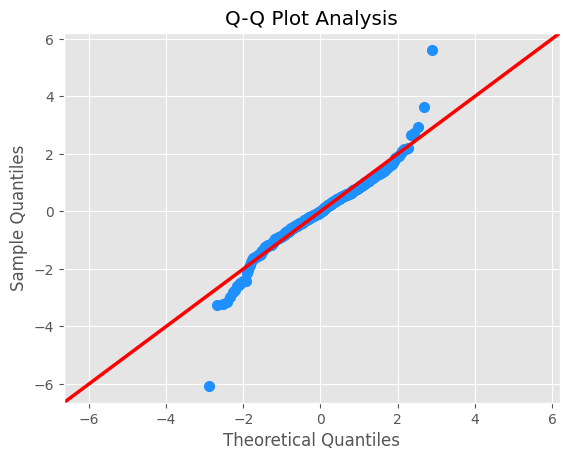

In [ ]:
# QQ Plot - Residuals are normally distributed
res_2 = y_2_test - y_pred_lir_2
plt.figure(figsize=(8, 6)) # Adjust figure size
fig = sm.qqplot(res_2, fit=True, line="45",
                markerfacecolor='dodgerblue',
                markeredgecolor='dodgerblue',
                markersize=7
               )
ax = fig.gca()
line_obj = ax.lines[1]
line_obj.set_color('red')
line_obj.set_linewidth(2.5)
plt.title("Q-Q Plot Analysis")
plt.xlabel("Theoretical Quantiles", fontsize=12) # Optional: Customize labels
plt.ylabel("Sample Quantiles", fontsize=12)
plt.grid(True) #Add grid
plt.show();

####Residuals vs Fitted Values Plot



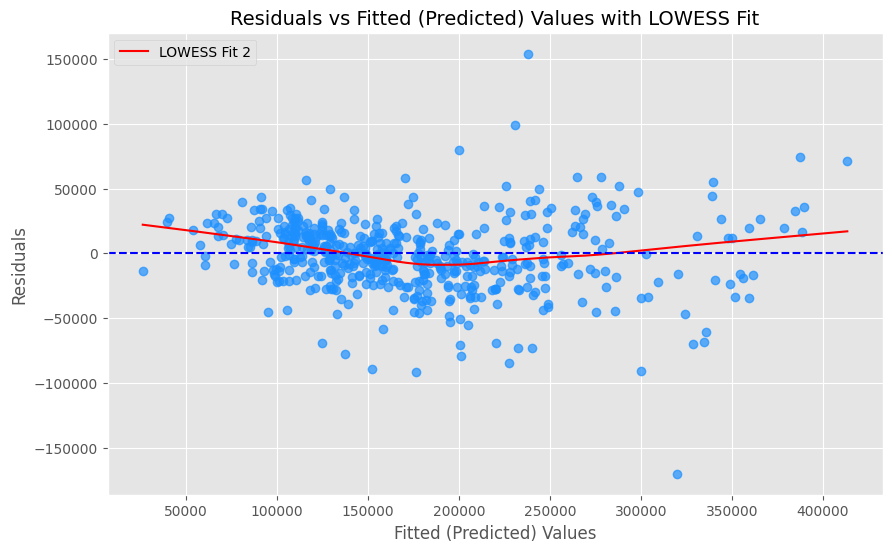

In [ ]:
# Residuals vs Fitted (Predicted) Values - Constant variance
# Plot a regression line, including local regression (lowess)

plt.figure(figsize=(10, 6))
sns.regplot(x = y_pred_lir_2, y = res_2, lowess = True,
            scatter_kws={'alpha': 0.7, 'color': 'dodgerblue', 'label': 'Residuals'}, # Customize scatter points
            line_kws={'color': 'red', 'lw': 1.5, 'linestyle': 'solid', 'label': 'LOWESS Fit 2'}) # Customize the LOWESS line

plt.axhline(y=0, color='blue', linestyle='--', linewidth=1.5) # Add the zero residual line
plt.title("Residuals vs Fitted (Predicted) Values with LOWESS Fit", fontsize=14)
plt.xlabel("Fitted (Predicted) Values", fontsize=12)
plt.ylabel("Residuals", fontsize=12)
plt.grid(True)
plt.legend(loc='upper left');
plt.show();

#### Residuals vs Time Plot

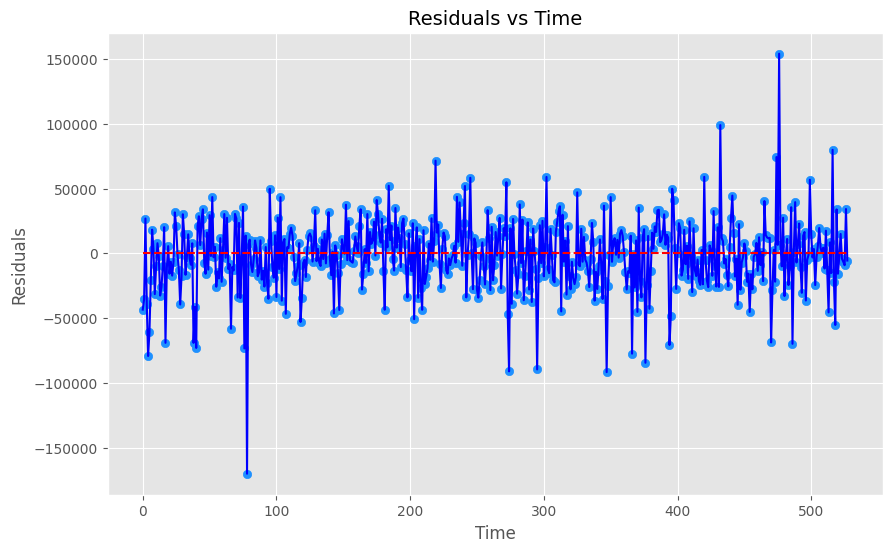

In [ ]:
# Residuals vs Time - indepedence
plt.figure(figsize = (10,6))
plt.scatter(range(len(res_2)), res_2, color='dodgerblue')
plt.plot(range(len(res_2)), res_2, 'b')
plt.title("Residuals vs Time", fontsize=14)
plt.xlabel("Time")
plt.ylabel("Residuals")
plt.hlines(0, min(range(len(res_2))), max(range(len(res_2))), colors = 'red', linestyles = 'dashed') ;

##Results--2.2: Linear regression

- This model provides a RMSE of about $33,005.39.
- Given these figures of mean and median of house price as 179,987 and 160,000, respectively, the RMSE of this linear regression model is off by 18-20%  of the average/median of the house price. This is likely unacceptable for the practical application.
- However, if this model is used for the prediction of the maximum range of house sale price of 500,000 - 745,000, the RMSE is off by 4-8% which is acceptable for using this model to predict the house sale price.

In [ ]:
# Create a data frame with the results from the models
model2_results = pd.DataFrame()
model2_results['Predictor'] = x_lir_2.columns
model2_results['Linear'] = house_fit_lir2.coef_
model2_results.sort_values(by=['Linear'],inplace=True, ascending=False)
model2_results

,Predictor,Linear
5,Kitchen Qual_Ex,57138.635766
0,Overall Qual,17987.436738
9,Foundation_PConc,5319.922368
4,Year Built,369.639548
7,Year Remod/Add,179.643728
1,Gr Liv Area,52.422518
2,1st Flr SF,33.632512
8,Kitchen Qual_TA,-4174.087515
3,Exter Qual_TA,-6736.688068
6,Full Bath,-8906.197655


## Regularization--2.2

###Lasso regression--2.2

In [ ]:
# %%capture --no-stdout
x_lasso_2 = house_data_combined[features_to_keep]
y_lasso_2 = house_data_combined['SalePrice']

# Specify values of alpha we want to try
alph2 = [50, 75, 100, 200, 300, ]

# Create empty list to hold results
lss_2_results_alpha = []

for i in alph:
  # Calculate CV RMSE
  n = 200
  lss_2_results = np.zeros(n)

  for idx in range(n):
    # Create the model
    house_fit_lasso2 = Lasso(alpha = i, tol = .01, max_iter=10_000); # Looping through alpha

    # Train, test split
    x_2_train, x_2_test, y_2_train, y_2_test = train_test_split(x_lasso_2, y_lasso_2, test_size=0.20)

    # Standard scale only training features
    scaler2 = StandardScaler()
    scaler2.fit(x_2_train)
    x_lss_train2 = scaler2.transform(x_2_train)

    # Scale testing features
    x_lss_test2 = scaler2.transform(x_2_test)

    # Fit regression
    house_fit_lasso2.fit(x_2_train, y_2_train)

    # Predict
    y_pred_lss_2 = house_fit_lasso2.predict(x_2_test)

    # Calculate and record performance metric
    # Calculate the percentage error (avoiding division by zero)
    percentage_error = np.where(y_2_test != 0, (y_2_test - y_pred_lss_2) / y_2_test, 0)
    # Calculate the mean of the squared percentage errors
    mean_squared_percentage_error = np.mean(np.square(percentage_error))
    # Take the square root to get RMSPE and multiply by 100
    lss_2_results[idx] = np.sqrt(mean_squared_percentage_error) * 100

  lss_2_results_alpha.append(lss_2_results.mean())

lss_2_results_df = pd.DataFrame({'Alpha': alph2, 'RMSPE': lss_2_results_alpha})


In [ ]:
lss_2_results_df.sort_values( by = 'RMSPE' )

,Alpha,RMSPE
0,50,20.609833
3,200,20.641785
1,75,20.676032
2,100,20.713834
4,300,20.718728


In [ ]:
# %%capture --no-stdout
# Perform CV
n = 500
lss_2_results = np.zeros(n)
for idx in range(n):
  # Train, test split
  x_2_train, x_2_test, y_2_train, y_2_test = train_test_split(x_lasso_2, y_lasso_2, test_size=0.20)

  # Standard scale only training features
  scaler2 = StandardScaler()
  scaler2.fit(x_2_train)
  x_lss_train2 = scaler2.transform(x_2_train)

  # Scale testing features
  x_lss2_test = scaler2.transform(x_2_test)

  # Create the model
  house_lss_model2 = Lasso(alpha = 200, tol = .01, max_iter=10000)

  # Fit regression
  house_lss_model2.fit(x_2_train, y_2_train)

  # Predict
  y_pred_lss_2 = house_lss_model2.predict(x_2_test)

  # Calculate and record performance metric
  # Calculate the percentage error (avoiding division by zero)
  percentage_error = np.where(y_2_test != 0, (y_2_test - y_pred_lss_2) / y_2_test, 0)
  # Calculate the mean of the squared percentage errors
  mean_squared_percentage_error = np.mean(np.square(percentage_error))
  # Take the square root to get RMSPE and multiply by 100
  lss_2_results[idx] = np.sqrt(mean_squared_percentage_error) * 100

print(f"CV RMSPE from lasso regression: {lss_2_results.mean().round(2)}")
print(f"Number of Predictors: {sum(house_lss_model2.coef_ >0)}")

CV RMSPE from lasso regression: 20.57
Number of Predictors: 7


In [ ]:
x_lasso_2.shape

(2637, 10)

In [ ]:
len(x_lasso_2.columns)

10

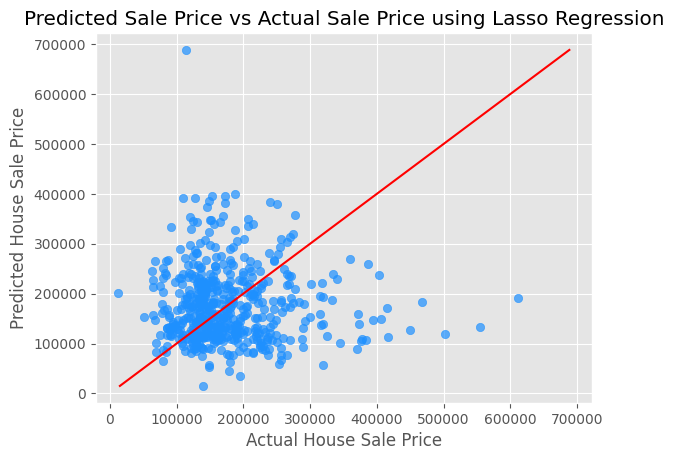

In [ ]:
# Observe how well this scaling model performs on our test data by using Lasso regression
plt.scatter(y_2_test, y_pred_lss_2, color = 'dodgerblue', alpha=0.7)
plt.plot([min(y_pred_lss_2), max(y_pred_lss_2)],[min(y_pred_lss_2), max(y_pred_lss_2)], c='red')
plt.title("Predicted Sale Price vs Actual Sale Price using Lasso Regression")
plt.xlabel('Actual House Sale Price')
plt.ylabel('Predicted House Sale Price') ;

In [ ]:
# Create a DataFrame with the predictor names and their Lasso coefficients
lasso_coefs_df = pd.DataFrame({
    'Predictor': x_lasso_2.columns,
    'Lasso': house_fit_lasso2.coef_
})

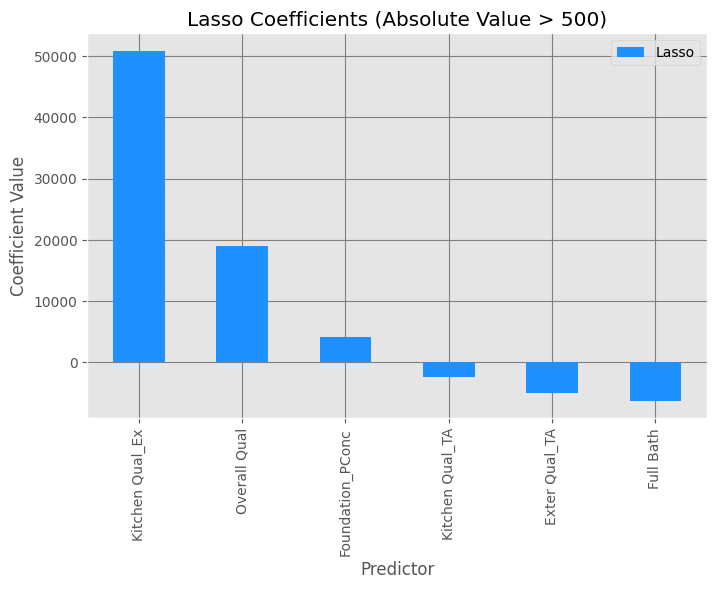

In [ ]:
# Select rows where the absolute value of the 'Lasso' coefficient is greater than 500
greater_0 = lasso_coefs_df[(abs(lasso_coefs_df['Lasso']) > 500)]

# Plot the filtered coefficients
greater_0.sort_values( by = ["Lasso"], ascending = False ).plot(x = 'Predictor',
                                                                kind = 'bar',
                                                                color='dodgerblue',
                                                                figsize = (8,5))

plt.grid(True, color='gray', which='major', axis='both')
plt.title('Lasso Coefficients (Absolute Value > 500)')
plt.ylabel('Coefficient Value')
plt.xlabel('Predictor')

plt.show();

###Ridge regression--2.2

In [ ]:
# %%capture --no-stdout
x_rr_2 = house_data_combined[features_to_keep]
y_rr_2 = house_data_combined['SalePrice']

# Specify values of alpha we want to try
alph2 = [50, 75, 100, 200, 300, ]

# Create empty list to hold results
rr_2_results_alpha = []

for i in alph2:
  # Calculate CV RMSPE
  n = 200
  rr_2_results = np.zeros(n)

  for idx in range(n):
    # Create the model
    house_fit_rr2 = Ridge(alpha = i, tol = .01, max_iter=10_000); # Looping through alpha

    # Train, test split
    x_2_train, x_2_test, y_2_train, y_2_test = train_test_split(x_rr_2, y_rr_2, test_size=0.20)

    # Standard scale only training features
    scaler_rr = StandardScaler()
    scaler_rr.fit(x_2_train)
    x_rr_train2 = scaler_rr.transform(x_2_train)

    # Scale testing features
    x_rr_test2 = scaler_rr.transform(x_2_test)

    # Fit regression
    house_fit_rr2.fit(x_2_train, y_2_train)

    # Predict
    y_pred_rr_2 = house_fit_rr2.predict(x_2_test)

    # Calculate and record performance metric
    # Calculate the percentage error (avoiding division by zero)
    percentage_error_rr2 = np.where(y_2_test != 0, (y_2_test - y_pred_rr_2) / y_2_test, 0)
    # Calculate the mean of the squared percentage errors
    mean_squared_percentage_error_rr2 = np.mean(np.square(percentage_error_rr2))
    # Take the square root to get RMSPE and multiply by 100
    rr_2_results[idx] = np.sqrt(mean_squared_percentage_error_rr2) * 100

  rr_2_results_alpha.append(rr_2_results.mean())

rr_2_results_df = pd.DataFrame({'Alpha': alph2, 'RMSPE': rr_2_results_alpha})

In [ ]:
# Sort to see which alpha value yields the lowest RMSPE
rr_2_results_df.sort_values( by = 'RMSPE' )

,Alpha,RMSPE
1,75,20.240431
0,50,20.493873
2,100,20.888023
3,200,20.943109
4,300,21.070852


In [ ]:
# %%capture --no-stdout
# Perform CV
n = 500
rr_2_results = np.zeros(n)
for idx in range(n):
  # Train, test split
  x_2_train, x_2_test, y_2_train, y_2_test = train_test_split(x_rr_2, y_rr_2, test_size=0.20)

  # Standard scale only training features
  scaler2 = StandardScaler()
  scaler2.fit(x_2_train)
  x_rr_train2 = scaler2.transform(x_2_train)

  # Scale testing features
  x_rr2_test = scaler2.transform(x_2_test)

  # Create the model
  house_rr_model2 = Ridge(alpha = 75, tol = .01, max_iter=10000)

  # Fit regression
  house_rr_model2.fit(x_2_train, y_2_train)

  # Predict
  y_pred_rr_2 = house_rr_model2.predict(x_2_test)

  # Calculate and record performance metric
  # Calculate the percentage error (avoiding division by zero)
  percentage_error_rr2 = np.where(y_2_test != 0, (y_2_test - y_pred_rr_2) / y_2_test, 0)
  # Calculate the mean of the squared percentage errors
  mean_squared_percentage_error_rr2 = np.mean(np.square(percentage_error_rr2))
  # Take the square root to get RMSPE and multiply by 100
  rr_2_results[idx] = np.sqrt(mean_squared_percentage_error_rr2) * 100

print(f"CV RMSPE from ridge regression: {rr_2_results.mean().round(2)}")
print(f"Number of Predictors: {sum(house_rr_model2.coef_ >0)}")

CV RMSPE from ridge regression: 20.87
Number of Predictors: 7


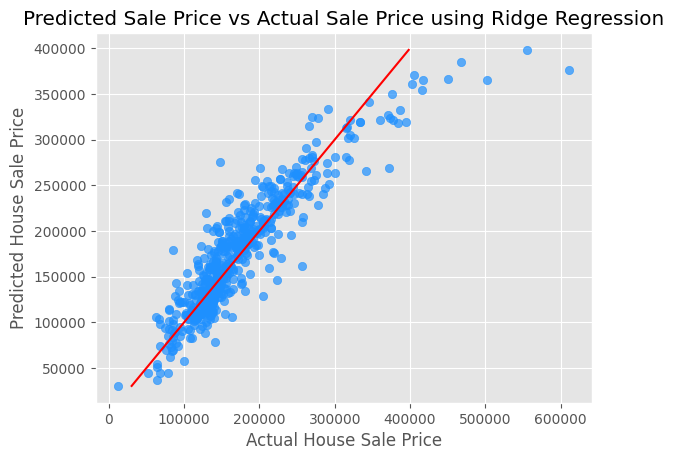

In [ ]:
# Observe how well this scaling model performs on our test data by using Ridge regression
plt.scatter(y_2_test, y_pred_rr_2, color = 'dodgerblue', alpha=0.7)
plt.plot([min(y_pred_rr_2), max(y_pred_rr_2)],[min(y_pred_rr_2), max(y_pred_rr_2)], c='red')
plt.title("Predicted Sale Price vs Actual Sale Price using Ridge Regression")
plt.xlabel('Actual House Sale Price')
plt.ylabel('Predicted House Sale Price') ;

In [ ]:
# Create a DataFrame with the predictor names and their Ridge coefficients
rr_coefs_df = pd.DataFrame({
    'Predictor': x_rr_2.columns,
    'Ridge': house_fit_rr2.coef_
})

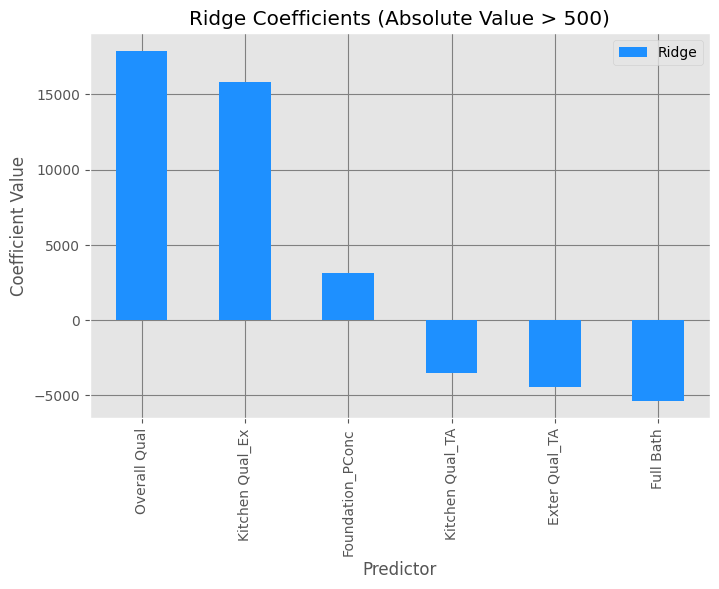

In [ ]:
# Select rows where the absolute value of the 'Ridge' coefficient is greater than 500
greater_0 = rr_coefs_df[(abs(rr_coefs_df['Ridge']) > 500)]

# Plot the filtered coefficients
greater_0.sort_values( by = ["Ridge"], ascending = False ).plot(x = 'Predictor',
                                                                kind = 'bar',
                                                                color='dodgerblue',
                                                                figsize = (8,5))

plt.grid(True, color='gray', which='major', axis='both')
plt.title('Ridge Coefficients (Absolute Value > 500)')
plt.ylabel('Coefficient Value')
plt.xlabel('Predictor')

plt.show();

## Data Visualization--2.2
- To visualize how Lasso regression, due to its L1 regularization, handles feature selection and coefficient shrinkage compared to standard linear regression

In [ ]:
# Add lasso regression results to the data frame created at the beginning before linear regression
model2_results['Lasso'] = house_lss_model2.coef_

In [ ]:
# Add ridge regression results to the data frame created at the beginning before linear regression
model2_results['Ridge'] = house_rr_model2.coef_

In [ ]:
model2_results

,Predictor,Linear,Lasso,Ridge
5,Kitchen Qual_Ex,57138.635766,17220.273872,19094.980176
0,Overall Qual,17987.436738,58.185593,52.549216
9,Foundation_PConc,5319.922368,37.003514,33.847337
4,Year Built,369.639548,-6755.982552,-6109.972495
7,Year Remod/Add,179.643728,427.755476,379.215316
1,Gr Liv Area,52.422518,50001.510383,31288.827822
2,1st Flr SF,33.632512,-11448.041134,-7144.432816
8,Kitchen Qual_TA,-4174.087515,182.945011,199.067676
3,Exter Qual_TA,-6736.688068,-2843.043720,-4923.676813
6,Full Bath,-8906.197655,4363.974130,4520.472547


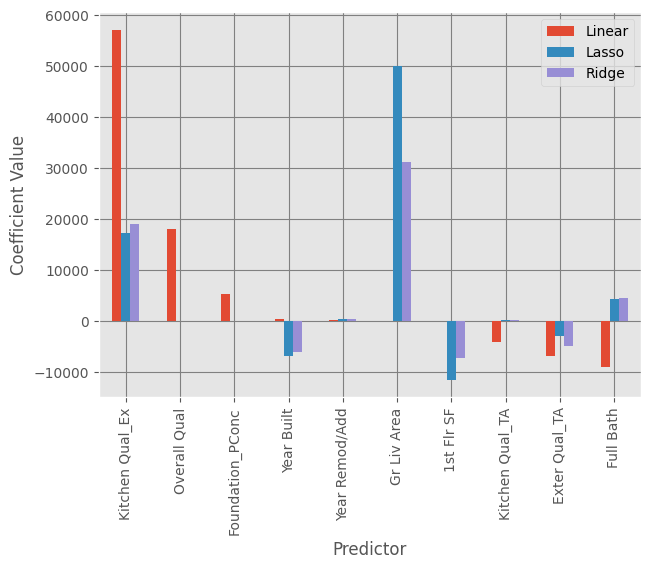

In [ ]:
# Plot the results of coefficients from all models
fig, ax = plt.subplots(1,1, figsize = (7,5))
model2_results.plot(x = 'Predictor', kind = 'bar', ax = ax)
ax.set_ylabel('Coefficient Value')
plt.grid(True, color='gray', which='major', axis='both')

##**Observation--2.2**
Comparison of coefficients obtained from linear, lasso and ridge regression models
1. Linear Regression (Orange Bars): shows very large positive coefficients for "Kitchen Qual_Ex" (around 58,000) and "Overall Qual" (around 17,000). "Foundation_PCCon" also has a notable positive coefficient.
 - Most other features ("Year Built", "Year Remod/Add", "Gr Liv Area", "1st Flr SF", "Kitchen Qual_TA", "Exter Qual_TA", "Full Bath") have relatively small coefficients, some positive, some negative. Notice "Gr Liv Area" is almost zero here.

2. Lasso Regression (Blue Bars): Lasso performs feature selection by shrinking some coefficients exactly to zero.
  - Strong Positive Impact: "Gr Liv Area" now has a very large positive coefficient (nearly 50,000). This is the most dominant feature in the Lasso model.
      - "Kitchen Qual_Ex" also retains a significant positive coefficient (around 19,000). "Full Bath" has a moderate positive coefficient (around 4,000).
      
  - Shrunk/Zeroed Coefficients:
      - "Overall Qual", "Foundation_PCCon", "Year Remod/Add", "Kitchen Qual_TA", and "Exter Qual_TA" have coefficients very close to zero or exactly zero, indicating Lasso has largely eliminated their influence.

  - Negative Impact: "Year Built" and "1st Flr SF" show small negative coefficients.

3. Ridge Regression (Purple Bars): Ridge regression shrinks coefficients towards zero but does not set them exactly to zero. It's good for handling multicollinearity.
  - Strong Positive Impact: "Gr Liv Area" has a large positive coefficient (around 33,000), though smaller than Lasso's. "Kitchen Qual_Ex" also has a significant positive coefficient (around 19,000). "Full Bath" has a moderate positive coefficient (around 6,000).

  - Reduced/Negative Impact: "Overall Qual" and "Foundation_PCCon" have their coefficients significantly reduced compared to the linear model. "Year Built", "1st Flr SF", "Kitchen Qual_TA", and "Exter Qual_TA" all show negative coefficients, typically smaller in magnitude than the positive ones.


**Which Features Are Important for This Prediction?**

- When comparing these models, Lasso and Ridge regularization methods often provide a more robust view of feature importance, especially in the presence of multicollinearity or irrelevant features.
- Based on the regularized models (Lasso and Ridge):
    - "Gr Liv Area" (Gross Living Area): This is consistently the most important feature across Lasso and Ridge models. It has the largest positive coefficients in both, indicating a very strong positive impact on the predicted outcome. Its coefficient dramatically increased from near zero in the linear model to very high values in Lasso and Ridge, suggesting that the linear model might have distributed its effect among correlated features.

    - "Kitchen Qual_Ex" (Kitchen Quality - Excellent): This feature also shows a consistently strong positive impact in all three models, maintaining a large coefficient in Lasso and Ridge, though slightly reduced from the Linear model. This means having an excellent kitchen quality is a significant positive predictor.
    
    - "Full Bath": This feature gains importance in both Lasso and Ridge models, showing a moderate positive impact. In the linear model, it had a small negative impact, but regularization revealed a positive relationship.

# Summary II:
- "Gr Liv Area" is clearly the most important predictor.

- "Kitchen Qual_Ex" is also a very important positive predictor.

- "Full Bath" is a moderately important positive predictor.

#**Conclusion:**

##RMSPE of all regression models
Feature Set| Linear | Lasso | Ridge |
- | - | :-: | - |
4 Features | 26.67% | 27.10% | 22.87% |
10 Features | 20.87% | 20.77% | 20.87% |

- Due to the residual analysis, linear regression is not a good fit for this dataset.

- RMSPE provides the average percentage by which regression model's predictions deviate from the actual values. On average, the predictions using these three models are off by about 21% of the actual house sale price in the data set of the selected 10 features while the 4-features implemented models are off by 23 - 27 % of the actual house sale price.

- Lasso regression performed automatic feature selection by setting the coefficients of less important variables to exactly zero. This helps to create a sparser and potentially more interpretable model by identifying and discarding irrelevant features.

- For all models, "Kitchen Qual_EX" and "Gr Liv Area" features are likely the most important predictors of house sale price of this dataset.



# Key Takeaways:

1. Feature selection in data cleaning and choosing a model type can be key elements to create a robust model with better accuracy for data prediction.

2. The shifts in coefficients from the linear model to Lasso and Ridge models highlight the benefits of regularization in identifying true feature importance and handling potential issues such as multicollinearity.

3. Lasso, in particular, performs aggressive features that are truly essential for the prediction. However, the choice between Lasso and Ridge often depends on whether the preference to focus on either the feature selection (Lasso) or just coefficient shrinking (Ridge) is more appropriate for the data and problem.

#Future Exploration:

- Learn to remove outliers to decrease %RMSPE and gain higher accuracy of the model prediction, by working with additional data operations (such as transformation of the data types and data imputation).

- Different types of regression models should be explored to create a better-fitting model with a low RMSPE for the data prediction.


#References:

1. The original data is available on AWS S3 at https://ddc-datascience.s3.
amazonaws.com/Projects/Project.1-Transactions/Data/Transaction.train.big.csv .
2. Data science lecture materials
3. Explanation of lasso and ridge regressions: https://www.geeksforgeeks.org/ridge-regression-vs-lasso-regression/